# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [ ]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms_list = [
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]
    
    return transforms_list

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
import os
import glob
from torchvision import transforms

class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 list_tran: Callable = None, 
                 extension: str = '.jpg'):
        
        # TODO: implement the init method
        
        self.directory = directory
        self.transform = list_tran
        self.extension = extension
        
#         self.root_dir = data_dir
        # Store file paths in __init__, not the images themselves
        self.image_paths = glob.glob(os.path.join(self.directory, f'*.{self.extension}'))
        
        self.data = []
        # CORRECT: Use glob.glob() to iterate through the files
        for img_path in glob.glob('{}/*{}'.format(self.directory, extension)):
            self.data.append(Image.open(img_path))
        trans_form_list = get_transforms((64, 64))
        
        # Define transformations to apply to each image
        self.transform = transforms.Compose(trans_form_list)
        
        
    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return self.data.__len__()

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        return self.transform(self.data[index])


In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

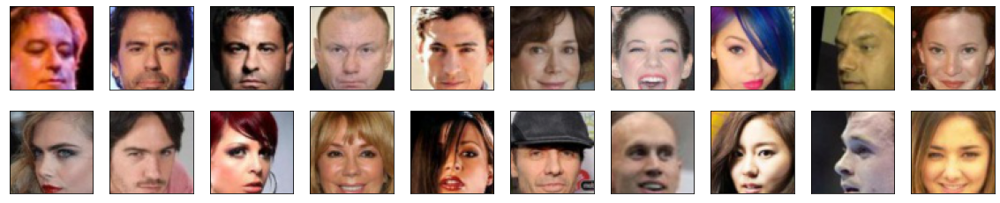

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:
from torch.nn import Module

In [8]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        
        # the (first) conv. without batch normalization
        self.conv1 = torch.nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4,
                                     stride=2, padding=1, bias=False) # img_size = 64*64 => 3*64*64
        
        self.conv2 = torch.nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4,
                                     stride=2, padding=1, bias=False) # => 128*16*16
        self.batchNorm2 = torch.nn.BatchNorm2d(128)
        
        self.conv3 = torch.nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4,
                                     stride=2, padding=1, bias=False) # => 256*8*8
        self.batchNorm3 = torch.nn.BatchNorm2d(256)

        self.conv4 = torch.nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4,
                                     stride=2, padding=1, bias=False) # => 512*4*4
        
        self.batchNorm4 = torch.nn.BatchNorm2d(512)
        
        self.flatten = torch.nn.Flatten()
        
        self.fc = torch.nn.Linear(512*4*4, 1)
        
        self.LeakyReLU = torch.nn.LeakyReLU(0.3)

        self.dropout = torch.nn.Dropout(0.3)
        

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method

        x = self.LeakyReLU(self.conv1(x))
        x = self.LeakyReLU(self.batchNorm2(self.conv2(x)))
        x = self.LeakyReLU(self.batchNorm3(self.conv3(x)))
        x = self.LeakyReLU(self.batchNorm4(self.conv4(x)))

        x = self.flatten(x)
        x = self.dropout(self.fc(x))

        return x.view(1, 1, 1, -1)

In [9]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [10]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        
        self.deconv1 = torch.nn.ConvTranspose2d(in_channels=latent_dim, out_channels=512,
                                                kernel_size=4, stride=1, padding=0, bias=False)
        self.batchNorm1 = torch.nn.BatchNorm2d(512)
        
        self.deconv2 = torch.nn.ConvTranspose2d(in_channels=512, out_channels=256,
                                                kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm2 = torch.nn.BatchNorm2d(256)
        
        
        self.deconv3 = torch.nn.ConvTranspose2d(in_channels=256, out_channels=128,
                                        kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm3 = torch.nn.BatchNorm2d(128)
        
        
        self.deconv4 = torch.nn.ConvTranspose2d(in_channels=128, out_channels=64,
                                kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm4 = torch.nn.BatchNorm2d(64)

        # the (last) conv. without batch normalization
        self.deconv5 = torch.nn.ConvTranspose2d(in_channels=64, out_channels=3,
                                        kernel_size=4, stride=2, padding=1, bias=True)

        self.relu = torch.nn.ReLU() # for conv. layers (except the last)
        self.tanh = torch.nn.Tanh() # for the last conv. layer

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        
        x = self.relu(self.batchNorm1(self.deconv1(x)))
        x = self.relu(self.batchNorm2(self.deconv2(x)))
        x = self.relu(self.batchNorm3(self.deconv3(x)))
        x = self.relu(self.batchNorm4(self.deconv4(x)))
        
        x = self.tanh(self.deconv5(x))

        return x

In [11]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [12]:
import torch.optim as optim

def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    # param based on experiments 
    lr_1 = 0.0002
    lr = 0.0001
    beta1=0.5
    beta2=0.999 # default.
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])

    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [13]:
def real_loss(D_out, smooth):

    labels = torch.ones_like(D_out)*0.9 if smooth else torch.ones_like(D_out) 
    labels = labels.cuda()
    
    criterion = torch.nn.BCEWithLogitsLoss()
    return criterion(D_out, labels) # loss


### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [14]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    return real_loss(D_fake, smooth= True)

def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    
    # real loss
    r_loss = real_loss(real_logits, smooth= True)
    
    # fake loss
    labels = torch.zeros_like(fake_logits).cuda() # all fake labels zeros
    criterion = torch.nn.BCEWithLogitsLoss()
    f_loss = criterion(fake_logits, labels)
    
    loss = r_loss + f_loss
    
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [15]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [16]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    
    g_optimizer.zero_grad()
    
    # generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()
    fake_images = generator(z)
    
    # get discriminator losses on fake images using flipped labels
    D_fake = discriminator(fake_images)
    g_loss = real_loss(D_fake, smooth= True)
    
    g_loss.backward()
    g_optimizer.step()

    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    
    gp=0 # I'm not using gradient penalty 
    
    d_optimizer.zero_grad()
    
    D_real = discriminator(real_images)
    
    # generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()
    fake_images = generator(z) 
    
    D_fake = discriminator(fake_images.detach())

    d_loss = discriminator_loss(D_real, D_fake)
    
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [17]:
from datetime import datetime

In [18]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 35

# number of images in each batch
batch_size = 64

In [19]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [20]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2025-09-21 02:01:20 | Epoch [1/35] | Batch 0/509 | d_loss: 1.5958 | g_loss: 1.2182
2025-09-21 02:01:24 | Epoch [1/35] | Batch 50/509 | d_loss: 0.9271 | g_loss: 4.7217
2025-09-21 02:01:27 | Epoch [1/35] | Batch 100/509 | d_loss: 0.8430 | g_loss: 5.9878
2025-09-21 02:01:31 | Epoch [1/35] | Batch 150/509 | d_loss: 1.0377 | g_loss: 3.5791
2025-09-21 02:01:34 | Epoch [1/35] | Batch 200/509 | d_loss: 1.4120 | g_loss: 3.0561
2025-09-21 02:01:38 | Epoch [1/35] | Batch 250/509 | d_loss: 1.4241 | g_loss: 2.5647
2025-09-21 02:01:41 | Epoch [1/35] | Batch 300/509 | d_loss: 1.4657 | g_loss: 2.5389
2025-09-21 02:01:45 | Epoch [1/35] | Batch 350/509 | d_loss: 1.3070 | g_loss: 2.6463
2025-09-21 02:01:48 | Epoch [1/35] | Batch 400/509 | d_loss: 1.0695 | g_loss: 3.0096
2025-09-21 02:01:52 | Epoch [1/35] | Batch 450/509 | d_loss: 1.1479 | g_loss: 2.7727
2025-09-21 02:01:55 | Epoch [1/35] | Batch 500/509 | d_loss: 1.2731 | g_loss: 2.0353


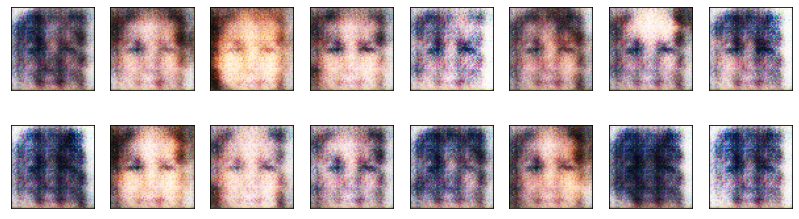

2025-09-21 02:01:59 | Epoch [2/35] | Batch 0/509 | d_loss: 1.0181 | g_loss: 1.3892
2025-09-21 02:02:02 | Epoch [2/35] | Batch 50/509 | d_loss: 1.2612 | g_loss: 1.2108
2025-09-21 02:02:06 | Epoch [2/35] | Batch 100/509 | d_loss: 1.2533 | g_loss: 1.5970
2025-09-21 02:02:09 | Epoch [2/35] | Batch 150/509 | d_loss: 1.2217 | g_loss: 1.2953
2025-09-21 02:02:13 | Epoch [2/35] | Batch 200/509 | d_loss: 1.2067 | g_loss: 1.3097
2025-09-21 02:02:17 | Epoch [2/35] | Batch 250/509 | d_loss: 2.1356 | g_loss: 1.1449
2025-09-21 02:02:20 | Epoch [2/35] | Batch 300/509 | d_loss: 1.1500 | g_loss: 1.7806
2025-09-21 02:02:24 | Epoch [2/35] | Batch 350/509 | d_loss: 1.5008 | g_loss: 2.4516
2025-09-21 02:02:28 | Epoch [2/35] | Batch 400/509 | d_loss: 1.2142 | g_loss: 2.2378
2025-09-21 02:02:31 | Epoch [2/35] | Batch 450/509 | d_loss: 1.1008 | g_loss: 2.0493
2025-09-21 02:02:35 | Epoch [2/35] | Batch 500/509 | d_loss: 1.1609 | g_loss: 1.3908


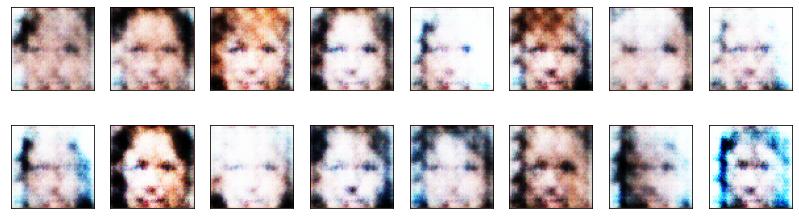

2025-09-21 02:02:39 | Epoch [3/35] | Batch 0/509 | d_loss: 1.0690 | g_loss: 1.7971
2025-09-21 02:02:42 | Epoch [3/35] | Batch 50/509 | d_loss: 1.3029 | g_loss: 1.8111
2025-09-21 02:02:46 | Epoch [3/35] | Batch 100/509 | d_loss: 1.5896 | g_loss: 2.9993
2025-09-21 02:02:50 | Epoch [3/35] | Batch 150/509 | d_loss: 1.1586 | g_loss: 1.8217
2025-09-21 02:02:54 | Epoch [3/35] | Batch 200/509 | d_loss: 1.1257 | g_loss: 1.7759
2025-09-21 02:02:58 | Epoch [3/35] | Batch 250/509 | d_loss: 1.2867 | g_loss: 1.0327
2025-09-21 02:03:02 | Epoch [3/35] | Batch 300/509 | d_loss: 1.4429 | g_loss: 2.4528
2025-09-21 02:03:06 | Epoch [3/35] | Batch 350/509 | d_loss: 1.2262 | g_loss: 1.7721
2025-09-21 02:03:10 | Epoch [3/35] | Batch 400/509 | d_loss: 1.2648 | g_loss: 1.3387
2025-09-21 02:03:14 | Epoch [3/35] | Batch 450/509 | d_loss: 1.1153 | g_loss: 1.6472
2025-09-21 02:03:18 | Epoch [3/35] | Batch 500/509 | d_loss: 1.6927 | g_loss: 1.3895


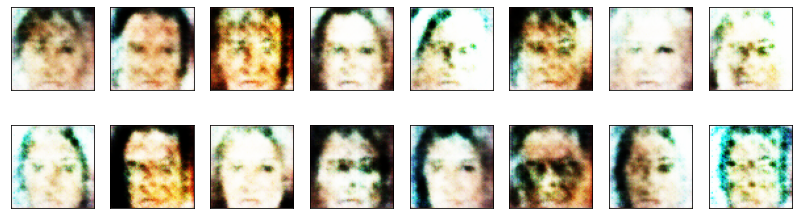

2025-09-21 02:03:22 | Epoch [4/35] | Batch 0/509 | d_loss: 1.1738 | g_loss: 1.5021
2025-09-21 02:03:25 | Epoch [4/35] | Batch 50/509 | d_loss: 1.3899 | g_loss: 1.0518
2025-09-21 02:03:29 | Epoch [4/35] | Batch 100/509 | d_loss: 1.2669 | g_loss: 1.3711
2025-09-21 02:03:33 | Epoch [4/35] | Batch 150/509 | d_loss: 1.1130 | g_loss: 1.2314
2025-09-21 02:03:37 | Epoch [4/35] | Batch 200/509 | d_loss: 1.0967 | g_loss: 2.1674
2025-09-21 02:03:41 | Epoch [4/35] | Batch 250/509 | d_loss: 1.0403 | g_loss: 1.8669
2025-09-21 02:03:45 | Epoch [4/35] | Batch 300/509 | d_loss: 1.2139 | g_loss: 2.1673
2025-09-21 02:03:49 | Epoch [4/35] | Batch 350/509 | d_loss: 1.2276 | g_loss: 1.7331
2025-09-21 02:03:53 | Epoch [4/35] | Batch 400/509 | d_loss: 1.1827 | g_loss: 1.7276
2025-09-21 02:03:56 | Epoch [4/35] | Batch 450/509 | d_loss: 1.1724 | g_loss: 1.5055
2025-09-21 02:04:00 | Epoch [4/35] | Batch 500/509 | d_loss: 1.1930 | g_loss: 1.1275


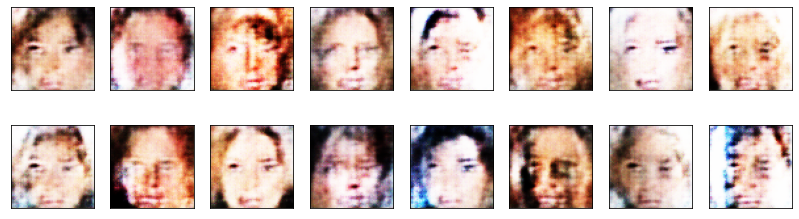

2025-09-21 02:04:04 | Epoch [5/35] | Batch 0/509 | d_loss: 1.1419 | g_loss: 1.2383
2025-09-21 02:04:08 | Epoch [5/35] | Batch 50/509 | d_loss: 1.1166 | g_loss: 1.5933
2025-09-21 02:04:12 | Epoch [5/35] | Batch 100/509 | d_loss: 1.1207 | g_loss: 1.4818
2025-09-21 02:04:15 | Epoch [5/35] | Batch 150/509 | d_loss: 1.3177 | g_loss: 1.0851
2025-09-21 02:04:19 | Epoch [5/35] | Batch 200/509 | d_loss: 1.2642 | g_loss: 1.6939
2025-09-21 02:04:23 | Epoch [5/35] | Batch 250/509 | d_loss: 1.5347 | g_loss: 2.3259
2025-09-21 02:04:27 | Epoch [5/35] | Batch 300/509 | d_loss: 1.1897 | g_loss: 1.6051
2025-09-21 02:04:31 | Epoch [5/35] | Batch 350/509 | d_loss: 1.2995 | g_loss: 0.9539
2025-09-21 02:04:35 | Epoch [5/35] | Batch 400/509 | d_loss: 1.1398 | g_loss: 1.0975
2025-09-21 02:04:39 | Epoch [5/35] | Batch 450/509 | d_loss: 1.0844 | g_loss: 1.4226
2025-09-21 02:04:43 | Epoch [5/35] | Batch 500/509 | d_loss: 1.1525 | g_loss: 1.2216


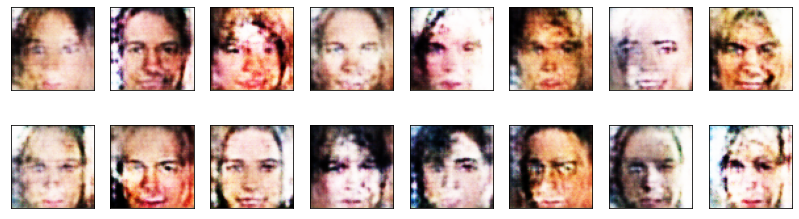

2025-09-21 02:04:47 | Epoch [6/35] | Batch 0/509 | d_loss: 1.1025 | g_loss: 1.5450
2025-09-21 02:04:50 | Epoch [6/35] | Batch 50/509 | d_loss: 0.9786 | g_loss: 1.5831
2025-09-21 02:04:54 | Epoch [6/35] | Batch 100/509 | d_loss: 1.1477 | g_loss: 1.2936
2025-09-21 02:04:58 | Epoch [6/35] | Batch 150/509 | d_loss: 1.1695 | g_loss: 1.2324
2025-09-21 02:05:02 | Epoch [6/35] | Batch 200/509 | d_loss: 1.2910 | g_loss: 0.8458
2025-09-21 02:05:06 | Epoch [6/35] | Batch 250/509 | d_loss: 1.3248 | g_loss: 1.6660
2025-09-21 02:05:10 | Epoch [6/35] | Batch 300/509 | d_loss: 1.2715 | g_loss: 0.9397
2025-09-21 02:05:14 | Epoch [6/35] | Batch 350/509 | d_loss: 1.2809 | g_loss: 0.8064
2025-09-21 02:05:18 | Epoch [6/35] | Batch 400/509 | d_loss: 1.0987 | g_loss: 1.1942
2025-09-21 02:05:21 | Epoch [6/35] | Batch 450/509 | d_loss: 1.0917 | g_loss: 1.2349
2025-09-21 02:05:25 | Epoch [6/35] | Batch 500/509 | d_loss: 1.1311 | g_loss: 1.3645


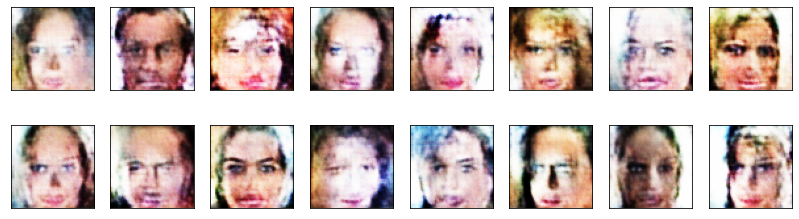

2025-09-21 02:05:29 | Epoch [7/35] | Batch 0/509 | d_loss: 0.8990 | g_loss: 1.8152
2025-09-21 02:05:32 | Epoch [7/35] | Batch 50/509 | d_loss: 1.1452 | g_loss: 1.6094
2025-09-21 02:05:36 | Epoch [7/35] | Batch 100/509 | d_loss: 1.1708 | g_loss: 1.8051
2025-09-21 02:05:40 | Epoch [7/35] | Batch 150/509 | d_loss: 1.1410 | g_loss: 1.0767
2025-09-21 02:05:44 | Epoch [7/35] | Batch 200/509 | d_loss: 1.1815 | g_loss: 1.5233
2025-09-21 02:05:48 | Epoch [7/35] | Batch 250/509 | d_loss: 1.3426 | g_loss: 2.3923
2025-09-21 02:05:52 | Epoch [7/35] | Batch 300/509 | d_loss: 1.3120 | g_loss: 1.2890
2025-09-21 02:05:56 | Epoch [7/35] | Batch 350/509 | d_loss: 1.1029 | g_loss: 1.2223
2025-09-21 02:06:00 | Epoch [7/35] | Batch 400/509 | d_loss: 1.1914 | g_loss: 1.4284
2025-09-21 02:06:04 | Epoch [7/35] | Batch 450/509 | d_loss: 1.0671 | g_loss: 1.1720
2025-09-21 02:06:08 | Epoch [7/35] | Batch 500/509 | d_loss: 1.2688 | g_loss: 1.1761


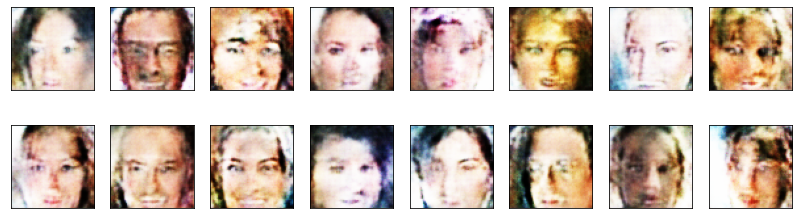

2025-09-21 02:06:11 | Epoch [8/35] | Batch 0/509 | d_loss: 1.1357 | g_loss: 1.4776
2025-09-21 02:06:15 | Epoch [8/35] | Batch 50/509 | d_loss: 1.2688 | g_loss: 1.4137
2025-09-21 02:06:19 | Epoch [8/35] | Batch 100/509 | d_loss: 0.9967 | g_loss: 1.3491
2025-09-21 02:06:23 | Epoch [8/35] | Batch 150/509 | d_loss: 1.1712 | g_loss: 1.2967
2025-09-21 02:06:26 | Epoch [8/35] | Batch 200/509 | d_loss: 1.2587 | g_loss: 0.9822
2025-09-21 02:06:30 | Epoch [8/35] | Batch 250/509 | d_loss: 1.4302 | g_loss: 1.7721
2025-09-21 02:06:34 | Epoch [8/35] | Batch 300/509 | d_loss: 1.1399 | g_loss: 1.1108
2025-09-21 02:06:38 | Epoch [8/35] | Batch 350/509 | d_loss: 1.1977 | g_loss: 1.1982
2025-09-21 02:06:42 | Epoch [8/35] | Batch 400/509 | d_loss: 1.3651 | g_loss: 1.9416
2025-09-21 02:06:46 | Epoch [8/35] | Batch 450/509 | d_loss: 1.1927 | g_loss: 1.6176
2025-09-21 02:06:50 | Epoch [8/35] | Batch 500/509 | d_loss: 1.1039 | g_loss: 1.9163


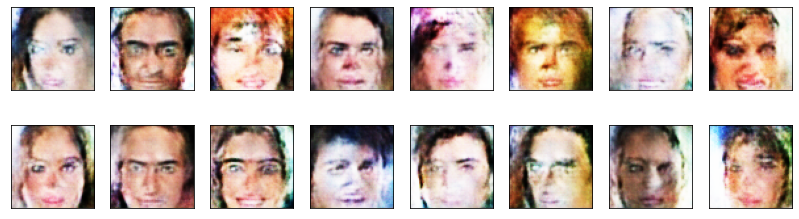

2025-09-21 02:06:53 | Epoch [9/35] | Batch 0/509 | d_loss: 1.0973 | g_loss: 1.1678
2025-09-21 02:06:57 | Epoch [9/35] | Batch 50/509 | d_loss: 1.1315 | g_loss: 1.2418
2025-09-21 02:07:01 | Epoch [9/35] | Batch 100/509 | d_loss: 1.2349 | g_loss: 1.8428
2025-09-21 02:07:05 | Epoch [9/35] | Batch 150/509 | d_loss: 1.1583 | g_loss: 1.3714
2025-09-21 02:07:09 | Epoch [9/35] | Batch 200/509 | d_loss: 1.0155 | g_loss: 1.7052
2025-09-21 02:07:13 | Epoch [9/35] | Batch 250/509 | d_loss: 1.1859 | g_loss: 1.6889
2025-09-21 02:07:17 | Epoch [9/35] | Batch 300/509 | d_loss: 1.1646 | g_loss: 1.0473
2025-09-21 02:07:21 | Epoch [9/35] | Batch 350/509 | d_loss: 1.1837 | g_loss: 2.0755
2025-09-21 02:07:25 | Epoch [9/35] | Batch 400/509 | d_loss: 1.2033 | g_loss: 1.1712
2025-09-21 02:07:29 | Epoch [9/35] | Batch 450/509 | d_loss: 1.0950 | g_loss: 1.4279
2025-09-21 02:07:32 | Epoch [9/35] | Batch 500/509 | d_loss: 1.0197 | g_loss: 1.5435


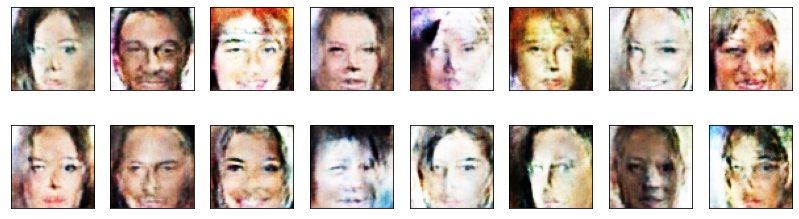

2025-09-21 02:07:36 | Epoch [10/35] | Batch 0/509 | d_loss: 0.9221 | g_loss: 1.3004
2025-09-21 02:07:40 | Epoch [10/35] | Batch 50/509 | d_loss: 1.0828 | g_loss: 2.2327
2025-09-21 02:07:44 | Epoch [10/35] | Batch 100/509 | d_loss: 1.2122 | g_loss: 1.9426
2025-09-21 02:07:48 | Epoch [10/35] | Batch 150/509 | d_loss: 1.1491 | g_loss: 1.6517
2025-09-21 02:07:52 | Epoch [10/35] | Batch 200/509 | d_loss: 1.0853 | g_loss: 1.3098
2025-09-21 02:07:56 | Epoch [10/35] | Batch 250/509 | d_loss: 1.1569 | g_loss: 1.1829
2025-09-21 02:07:59 | Epoch [10/35] | Batch 300/509 | d_loss: 1.1008 | g_loss: 1.2299
2025-09-21 02:08:03 | Epoch [10/35] | Batch 350/509 | d_loss: 0.9807 | g_loss: 1.5679
2025-09-21 02:08:07 | Epoch [10/35] | Batch 400/509 | d_loss: 1.0620 | g_loss: 2.0109
2025-09-21 02:08:11 | Epoch [10/35] | Batch 450/509 | d_loss: 1.1674 | g_loss: 1.7994
2025-09-21 02:08:15 | Epoch [10/35] | Batch 500/509 | d_loss: 1.1108 | g_loss: 2.1149


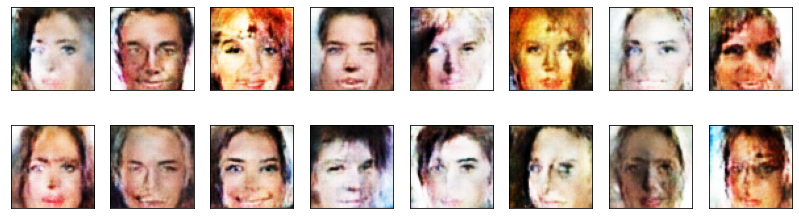

2025-09-21 02:08:19 | Epoch [11/35] | Batch 0/509 | d_loss: 1.0373 | g_loss: 1.6191
2025-09-21 02:08:23 | Epoch [11/35] | Batch 50/509 | d_loss: 1.0132 | g_loss: 1.6543
2025-09-21 02:08:26 | Epoch [11/35] | Batch 100/509 | d_loss: 1.3320 | g_loss: 2.0562
2025-09-21 02:08:30 | Epoch [11/35] | Batch 150/509 | d_loss: 1.0809 | g_loss: 1.4559
2025-09-21 02:08:34 | Epoch [11/35] | Batch 200/509 | d_loss: 1.0851 | g_loss: 1.3231
2025-09-21 02:08:38 | Epoch [11/35] | Batch 250/509 | d_loss: 1.1413 | g_loss: 1.0879
2025-09-21 02:08:42 | Epoch [11/35] | Batch 300/509 | d_loss: 0.9575 | g_loss: 1.5310
2025-09-21 02:08:46 | Epoch [11/35] | Batch 350/509 | d_loss: 1.0490 | g_loss: 2.1546
2025-09-21 02:08:50 | Epoch [11/35] | Batch 400/509 | d_loss: 1.0874 | g_loss: 1.5663
2025-09-21 02:08:54 | Epoch [11/35] | Batch 450/509 | d_loss: 1.0448 | g_loss: 1.1255
2025-09-21 02:08:58 | Epoch [11/35] | Batch 500/509 | d_loss: 1.1461 | g_loss: 1.2815


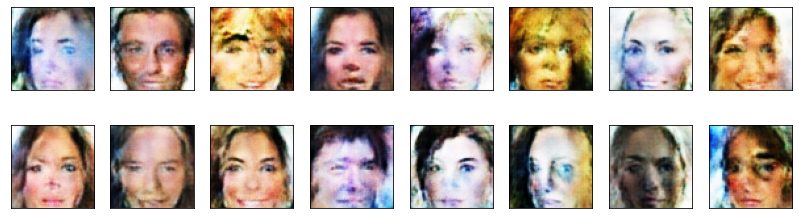

2025-09-21 02:09:02 | Epoch [12/35] | Batch 0/509 | d_loss: 0.9779 | g_loss: 1.3973
2025-09-21 02:09:06 | Epoch [12/35] | Batch 50/509 | d_loss: 1.2238 | g_loss: 1.0291
2025-09-21 02:09:10 | Epoch [12/35] | Batch 100/509 | d_loss: 1.0841 | g_loss: 2.1421
2025-09-21 02:09:13 | Epoch [12/35] | Batch 150/509 | d_loss: 0.8768 | g_loss: 1.4164
2025-09-21 02:09:17 | Epoch [12/35] | Batch 200/509 | d_loss: 1.2110 | g_loss: 1.3976
2025-09-21 02:09:21 | Epoch [12/35] | Batch 250/509 | d_loss: 1.1254 | g_loss: 1.0315
2025-09-21 02:09:25 | Epoch [12/35] | Batch 300/509 | d_loss: 1.0915 | g_loss: 1.3392
2025-09-21 02:09:29 | Epoch [12/35] | Batch 350/509 | d_loss: 1.0982 | g_loss: 1.9465
2025-09-21 02:09:33 | Epoch [12/35] | Batch 400/509 | d_loss: 1.0577 | g_loss: 1.2246
2025-09-21 02:09:37 | Epoch [12/35] | Batch 450/509 | d_loss: 1.0661 | g_loss: 1.8110
2025-09-21 02:09:41 | Epoch [12/35] | Batch 500/509 | d_loss: 1.1870 | g_loss: 0.9771


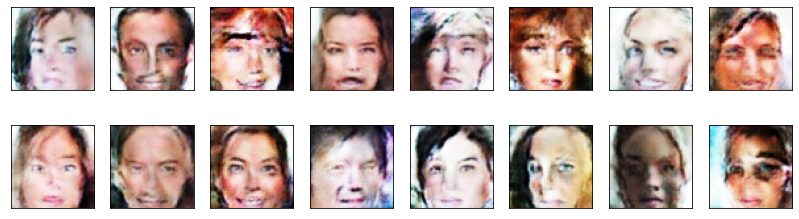

2025-09-21 02:09:44 | Epoch [13/35] | Batch 0/509 | d_loss: 1.0131 | g_loss: 0.9696
2025-09-21 02:09:48 | Epoch [13/35] | Batch 50/509 | d_loss: 1.1817 | g_loss: 2.6929
2025-09-21 02:09:52 | Epoch [13/35] | Batch 100/509 | d_loss: 1.0497 | g_loss: 1.1495
2025-09-21 02:09:56 | Epoch [13/35] | Batch 150/509 | d_loss: 0.8972 | g_loss: 1.5210
2025-09-21 02:10:00 | Epoch [13/35] | Batch 200/509 | d_loss: 1.1264 | g_loss: 1.4116
2025-09-21 02:10:04 | Epoch [13/35] | Batch 250/509 | d_loss: 1.0774 | g_loss: 1.0042
2025-09-21 02:10:08 | Epoch [13/35] | Batch 300/509 | d_loss: 1.4612 | g_loss: 1.0303
2025-09-21 02:10:12 | Epoch [13/35] | Batch 350/509 | d_loss: 1.3235 | g_loss: 1.0245
2025-09-21 02:10:15 | Epoch [13/35] | Batch 400/509 | d_loss: 1.1037 | g_loss: 1.4599
2025-09-21 02:10:19 | Epoch [13/35] | Batch 450/509 | d_loss: 1.2270 | g_loss: 2.3486
2025-09-21 02:10:23 | Epoch [13/35] | Batch 500/509 | d_loss: 1.1366 | g_loss: 1.5627


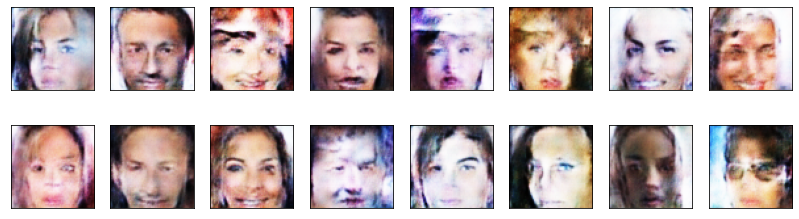

2025-09-21 02:10:27 | Epoch [14/35] | Batch 0/509 | d_loss: 0.9731 | g_loss: 1.8220
2025-09-21 02:10:31 | Epoch [14/35] | Batch 50/509 | d_loss: 1.2216 | g_loss: 2.6512
2025-09-21 02:10:35 | Epoch [14/35] | Batch 100/509 | d_loss: 1.1912 | g_loss: 1.7979
2025-09-21 02:10:38 | Epoch [14/35] | Batch 150/509 | d_loss: 1.0607 | g_loss: 1.3070
2025-09-21 02:10:42 | Epoch [14/35] | Batch 200/509 | d_loss: 1.0304 | g_loss: 2.0919
2025-09-21 02:10:46 | Epoch [14/35] | Batch 250/509 | d_loss: 1.2899 | g_loss: 2.0294
2025-09-21 02:10:50 | Epoch [14/35] | Batch 300/509 | d_loss: 1.0053 | g_loss: 1.5467
2025-09-21 02:10:54 | Epoch [14/35] | Batch 350/509 | d_loss: 1.0800 | g_loss: 1.0873
2025-09-21 02:10:58 | Epoch [14/35] | Batch 400/509 | d_loss: 1.0720 | g_loss: 1.3891
2025-09-21 02:11:02 | Epoch [14/35] | Batch 450/509 | d_loss: 1.1699 | g_loss: 1.4197
2025-09-21 02:11:06 | Epoch [14/35] | Batch 500/509 | d_loss: 1.1763 | g_loss: 1.5044


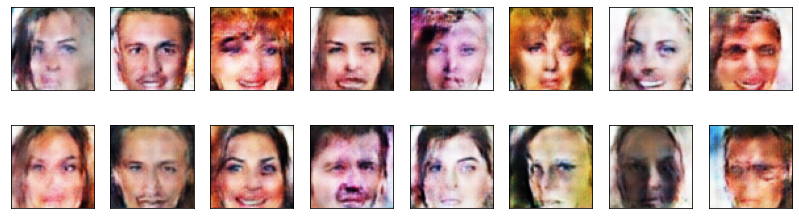

2025-09-21 02:11:09 | Epoch [15/35] | Batch 0/509 | d_loss: 0.9882 | g_loss: 1.6647
2025-09-21 02:11:13 | Epoch [15/35] | Batch 50/509 | d_loss: 1.0854 | g_loss: 1.4923
2025-09-21 02:11:17 | Epoch [15/35] | Batch 100/509 | d_loss: 1.0419 | g_loss: 1.5357
2025-09-21 02:11:21 | Epoch [15/35] | Batch 150/509 | d_loss: 1.0408 | g_loss: 1.3016
2025-09-21 02:11:25 | Epoch [15/35] | Batch 200/509 | d_loss: 1.0753 | g_loss: 1.2643
2025-09-21 02:11:29 | Epoch [15/35] | Batch 250/509 | d_loss: 1.1004 | g_loss: 1.5653
2025-09-21 02:11:33 | Epoch [15/35] | Batch 300/509 | d_loss: 1.1400 | g_loss: 1.2395
2025-09-21 02:11:37 | Epoch [15/35] | Batch 350/509 | d_loss: 1.1400 | g_loss: 1.9170
2025-09-21 02:11:41 | Epoch [15/35] | Batch 400/509 | d_loss: 0.9822 | g_loss: 1.5645
2025-09-21 02:11:44 | Epoch [15/35] | Batch 450/509 | d_loss: 1.0405 | g_loss: 1.5672
2025-09-21 02:11:48 | Epoch [15/35] | Batch 500/509 | d_loss: 1.1481 | g_loss: 1.3733


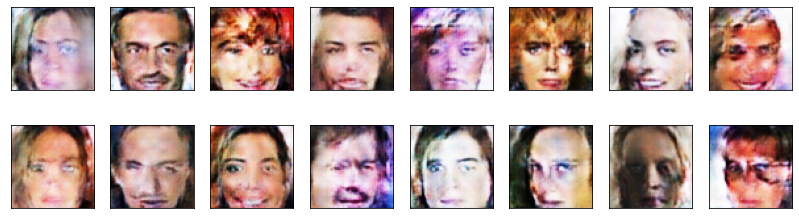

2025-09-21 02:11:52 | Epoch [16/35] | Batch 0/509 | d_loss: 1.0614 | g_loss: 1.7207
2025-09-21 02:11:56 | Epoch [16/35] | Batch 50/509 | d_loss: 1.2457 | g_loss: 1.3782
2025-09-21 02:12:00 | Epoch [16/35] | Batch 100/509 | d_loss: 1.0729 | g_loss: 2.1378
2025-09-21 02:12:04 | Epoch [16/35] | Batch 150/509 | d_loss: 1.1158 | g_loss: 2.1115
2025-09-21 02:12:08 | Epoch [16/35] | Batch 200/509 | d_loss: 1.0122 | g_loss: 1.5778
2025-09-21 02:12:12 | Epoch [16/35] | Batch 250/509 | d_loss: 0.9931 | g_loss: 1.4756
2025-09-21 02:12:15 | Epoch [16/35] | Batch 300/509 | d_loss: 1.0450 | g_loss: 0.8869
2025-09-21 02:12:19 | Epoch [16/35] | Batch 350/509 | d_loss: 1.1621 | g_loss: 0.7701
2025-09-21 02:12:23 | Epoch [16/35] | Batch 400/509 | d_loss: 1.0013 | g_loss: 1.8741
2025-09-21 02:12:27 | Epoch [16/35] | Batch 450/509 | d_loss: 1.0400 | g_loss: 1.5519
2025-09-21 02:12:31 | Epoch [16/35] | Batch 500/509 | d_loss: 1.2529 | g_loss: 1.3119


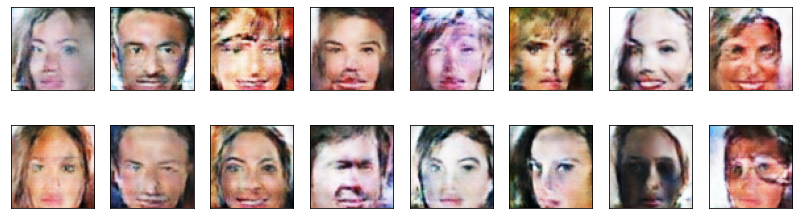

2025-09-21 02:12:35 | Epoch [17/35] | Batch 0/509 | d_loss: 1.1370 | g_loss: 1.2507
2025-09-21 02:12:39 | Epoch [17/35] | Batch 50/509 | d_loss: 1.1005 | g_loss: 1.6690
2025-09-21 02:12:42 | Epoch [17/35] | Batch 100/509 | d_loss: 0.9756 | g_loss: 2.0823
2025-09-21 02:12:46 | Epoch [17/35] | Batch 150/509 | d_loss: 1.0078 | g_loss: 1.5429
2025-09-21 02:12:50 | Epoch [17/35] | Batch 200/509 | d_loss: 1.0542 | g_loss: 1.7306
2025-09-21 02:12:54 | Epoch [17/35] | Batch 250/509 | d_loss: 1.2304 | g_loss: 1.0911
2025-09-21 02:12:58 | Epoch [17/35] | Batch 300/509 | d_loss: 1.1720 | g_loss: 1.1902
2025-09-21 02:13:02 | Epoch [17/35] | Batch 350/509 | d_loss: 1.1182 | g_loss: 1.9354
2025-09-21 02:13:06 | Epoch [17/35] | Batch 400/509 | d_loss: 1.0107 | g_loss: 2.1797
2025-09-21 02:13:10 | Epoch [17/35] | Batch 450/509 | d_loss: 1.1071 | g_loss: 1.4452
2025-09-21 02:13:14 | Epoch [17/35] | Batch 500/509 | d_loss: 0.9354 | g_loss: 1.7673


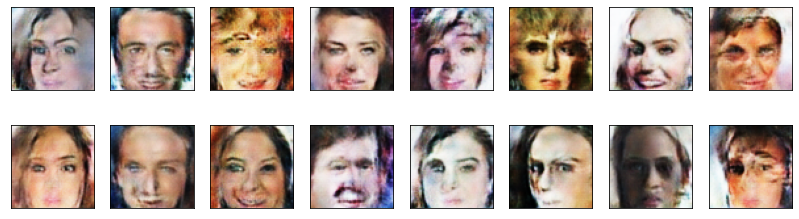

2025-09-21 02:13:18 | Epoch [18/35] | Batch 0/509 | d_loss: 0.9406 | g_loss: 1.4230
2025-09-21 02:13:22 | Epoch [18/35] | Batch 50/509 | d_loss: 1.2291 | g_loss: 0.8134
2025-09-21 02:13:26 | Epoch [18/35] | Batch 100/509 | d_loss: 1.2677 | g_loss: 2.1531
2025-09-21 02:13:30 | Epoch [18/35] | Batch 150/509 | d_loss: 0.9589 | g_loss: 1.6296
2025-09-21 02:13:33 | Epoch [18/35] | Batch 200/509 | d_loss: 1.0381 | g_loss: 1.1978
2025-09-21 02:13:37 | Epoch [18/35] | Batch 250/509 | d_loss: 0.9731 | g_loss: 1.9951
2025-09-21 02:13:41 | Epoch [18/35] | Batch 300/509 | d_loss: 1.1630 | g_loss: 1.5230
2025-09-21 02:13:45 | Epoch [18/35] | Batch 350/509 | d_loss: 0.9879 | g_loss: 1.5834
2025-09-21 02:13:49 | Epoch [18/35] | Batch 400/509 | d_loss: 1.1461 | g_loss: 1.1209
2025-09-21 02:13:53 | Epoch [18/35] | Batch 450/509 | d_loss: 1.0322 | g_loss: 1.6522
2025-09-21 02:13:57 | Epoch [18/35] | Batch 500/509 | d_loss: 0.9185 | g_loss: 1.4617


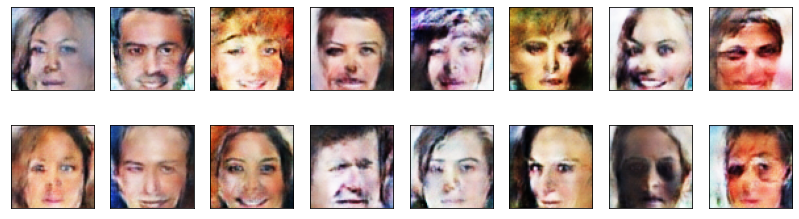

2025-09-21 02:14:01 | Epoch [19/35] | Batch 0/509 | d_loss: 1.0439 | g_loss: 1.0733
2025-09-21 02:14:05 | Epoch [19/35] | Batch 50/509 | d_loss: 1.1243 | g_loss: 1.7963
2025-09-21 02:14:09 | Epoch [19/35] | Batch 100/509 | d_loss: 1.0190 | g_loss: 1.7665
2025-09-21 02:14:13 | Epoch [19/35] | Batch 150/509 | d_loss: 0.9785 | g_loss: 0.9756
2025-09-21 02:14:17 | Epoch [19/35] | Batch 200/509 | d_loss: 1.1304 | g_loss: 0.8794
2025-09-21 02:14:20 | Epoch [19/35] | Batch 250/509 | d_loss: 0.8162 | g_loss: 1.9723
2025-09-21 02:14:24 | Epoch [19/35] | Batch 300/509 | d_loss: 1.1723 | g_loss: 1.6226
2025-09-21 02:14:28 | Epoch [19/35] | Batch 350/509 | d_loss: 1.0178 | g_loss: 1.9882
2025-09-21 02:14:32 | Epoch [19/35] | Batch 400/509 | d_loss: 0.9894 | g_loss: 1.2131
2025-09-21 02:14:36 | Epoch [19/35] | Batch 450/509 | d_loss: 1.4303 | g_loss: 3.4530
2025-09-21 02:14:40 | Epoch [19/35] | Batch 500/509 | d_loss: 0.9844 | g_loss: 0.9884


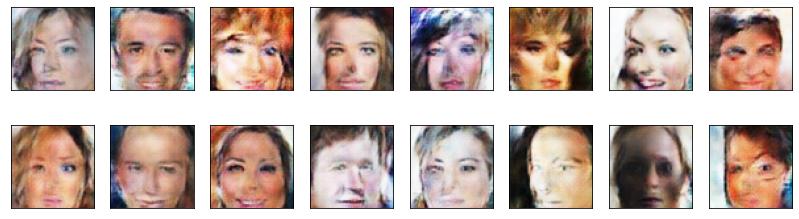

2025-09-21 02:14:44 | Epoch [20/35] | Batch 0/509 | d_loss: 0.9634 | g_loss: 1.5078
2025-09-21 02:14:47 | Epoch [20/35] | Batch 50/509 | d_loss: 1.0294 | g_loss: 1.5987
2025-09-21 02:14:51 | Epoch [20/35] | Batch 100/509 | d_loss: 1.4068 | g_loss: 1.0158
2025-09-21 02:14:55 | Epoch [20/35] | Batch 150/509 | d_loss: 1.2416 | g_loss: 0.9212
2025-09-21 02:14:59 | Epoch [20/35] | Batch 200/509 | d_loss: 1.0845 | g_loss: 1.1058
2025-09-21 02:15:03 | Epoch [20/35] | Batch 250/509 | d_loss: 1.0877 | g_loss: 1.1904
2025-09-21 02:15:07 | Epoch [20/35] | Batch 300/509 | d_loss: 0.9585 | g_loss: 1.4572
2025-09-21 02:15:11 | Epoch [20/35] | Batch 350/509 | d_loss: 0.9835 | g_loss: 2.0662
2025-09-21 02:15:15 | Epoch [20/35] | Batch 400/509 | d_loss: 1.0236 | g_loss: 1.8114
2025-09-21 02:15:18 | Epoch [20/35] | Batch 450/509 | d_loss: 0.9324 | g_loss: 1.7880
2025-09-21 02:15:22 | Epoch [20/35] | Batch 500/509 | d_loss: 0.7964 | g_loss: 1.6499


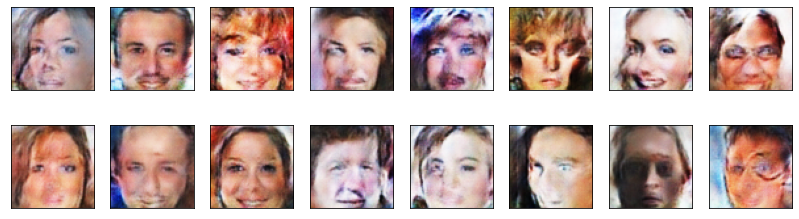

2025-09-21 02:15:26 | Epoch [21/35] | Batch 0/509 | d_loss: 0.8884 | g_loss: 1.3917
2025-09-21 02:15:30 | Epoch [21/35] | Batch 50/509 | d_loss: 0.8450 | g_loss: 1.8557
2025-09-21 02:15:33 | Epoch [21/35] | Batch 100/509 | d_loss: 0.9016 | g_loss: 2.0423
2025-09-21 02:15:37 | Epoch [21/35] | Batch 150/509 | d_loss: 1.6973 | g_loss: 2.8140
2025-09-21 02:15:41 | Epoch [21/35] | Batch 200/509 | d_loss: 1.0602 | g_loss: 1.7263
2025-09-21 02:15:45 | Epoch [21/35] | Batch 250/509 | d_loss: 0.9357 | g_loss: 1.7466
2025-09-21 02:15:49 | Epoch [21/35] | Batch 300/509 | d_loss: 1.0389 | g_loss: 1.6557
2025-09-21 02:15:53 | Epoch [21/35] | Batch 350/509 | d_loss: 1.4801 | g_loss: 1.7800
2025-09-21 02:15:57 | Epoch [21/35] | Batch 400/509 | d_loss: 0.9796 | g_loss: 1.9006
2025-09-21 02:16:01 | Epoch [21/35] | Batch 450/509 | d_loss: 1.0708 | g_loss: 2.1650
2025-09-21 02:16:05 | Epoch [21/35] | Batch 500/509 | d_loss: 0.9866 | g_loss: 1.4173


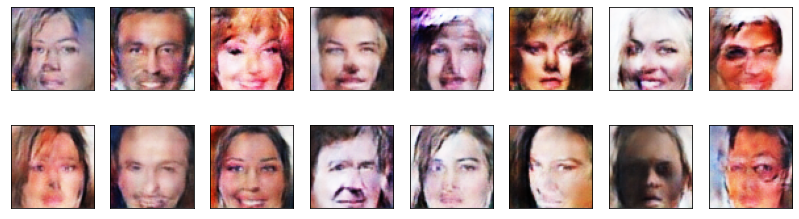

2025-09-21 02:16:08 | Epoch [22/35] | Batch 0/509 | d_loss: 0.9435 | g_loss: 1.5961
2025-09-21 02:16:12 | Epoch [22/35] | Batch 50/509 | d_loss: 1.1649 | g_loss: 2.5999
2025-09-21 02:16:16 | Epoch [22/35] | Batch 100/509 | d_loss: 1.0395 | g_loss: 1.5642
2025-09-21 02:16:20 | Epoch [22/35] | Batch 150/509 | d_loss: 0.8740 | g_loss: 1.5871
2025-09-21 02:16:24 | Epoch [22/35] | Batch 200/509 | d_loss: 1.1119 | g_loss: 2.6028
2025-09-21 02:16:28 | Epoch [22/35] | Batch 250/509 | d_loss: 1.1800 | g_loss: 2.6569
2025-09-21 02:16:31 | Epoch [22/35] | Batch 300/509 | d_loss: 0.9023 | g_loss: 1.5117
2025-09-21 02:16:35 | Epoch [22/35] | Batch 350/509 | d_loss: 0.9722 | g_loss: 2.3728
2025-09-21 02:16:39 | Epoch [22/35] | Batch 400/509 | d_loss: 1.0125 | g_loss: 1.4375
2025-09-21 02:16:43 | Epoch [22/35] | Batch 450/509 | d_loss: 0.9527 | g_loss: 2.0626
2025-09-21 02:16:47 | Epoch [22/35] | Batch 500/509 | d_loss: 1.1507 | g_loss: 2.1897


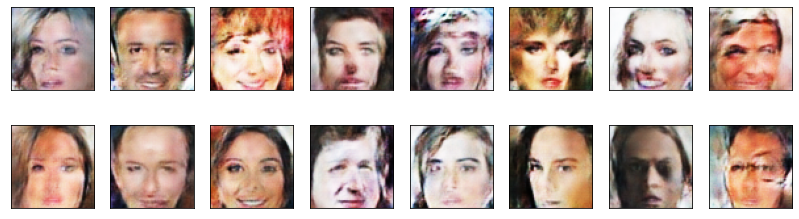

2025-09-21 02:16:51 | Epoch [23/35] | Batch 0/509 | d_loss: 0.8656 | g_loss: 1.3256
2025-09-21 02:16:55 | Epoch [23/35] | Batch 50/509 | d_loss: 0.9987 | g_loss: 2.2048
2025-09-21 02:16:59 | Epoch [23/35] | Batch 100/509 | d_loss: 0.8942 | g_loss: 1.1410
2025-09-21 02:17:03 | Epoch [23/35] | Batch 150/509 | d_loss: 1.1347 | g_loss: 2.4419
2025-09-21 02:17:07 | Epoch [23/35] | Batch 200/509 | d_loss: 1.3572 | g_loss: 1.2803
2025-09-21 02:17:11 | Epoch [23/35] | Batch 250/509 | d_loss: 1.2133 | g_loss: 1.2884
2025-09-21 02:17:14 | Epoch [23/35] | Batch 300/509 | d_loss: 1.2634 | g_loss: 1.1507
2025-09-21 02:17:18 | Epoch [23/35] | Batch 350/509 | d_loss: 0.9699 | g_loss: 1.4689
2025-09-21 02:17:22 | Epoch [23/35] | Batch 400/509 | d_loss: 0.9762 | g_loss: 1.4625
2025-09-21 02:17:26 | Epoch [23/35] | Batch 450/509 | d_loss: 1.0177 | g_loss: 1.8808
2025-09-21 02:17:30 | Epoch [23/35] | Batch 500/509 | d_loss: 1.0938 | g_loss: 2.4627


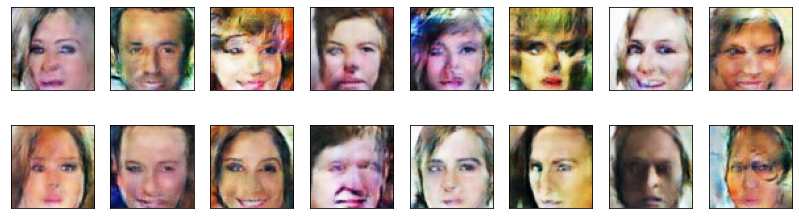

2025-09-21 02:17:34 | Epoch [24/35] | Batch 0/509 | d_loss: 1.0086 | g_loss: 2.0408
2025-09-21 02:17:37 | Epoch [24/35] | Batch 50/509 | d_loss: 0.9775 | g_loss: 0.9815
2025-09-21 02:17:41 | Epoch [24/35] | Batch 100/509 | d_loss: 0.8393 | g_loss: 1.5184
2025-09-21 02:17:45 | Epoch [24/35] | Batch 150/509 | d_loss: 0.9487 | g_loss: 1.5081
2025-09-21 02:17:49 | Epoch [24/35] | Batch 200/509 | d_loss: 0.9771 | g_loss: 1.2429
2025-09-21 02:17:53 | Epoch [24/35] | Batch 250/509 | d_loss: 0.9985 | g_loss: 1.2014
2025-09-21 02:17:57 | Epoch [24/35] | Batch 300/509 | d_loss: 0.9073 | g_loss: 1.5931
2025-09-21 02:18:01 | Epoch [24/35] | Batch 350/509 | d_loss: 1.2186 | g_loss: 1.2220
2025-09-21 02:18:05 | Epoch [24/35] | Batch 400/509 | d_loss: 0.9411 | g_loss: 1.4766
2025-09-21 02:18:08 | Epoch [24/35] | Batch 450/509 | d_loss: 0.8953 | g_loss: 1.3545
2025-09-21 02:18:12 | Epoch [24/35] | Batch 500/509 | d_loss: 1.4919 | g_loss: 0.9037


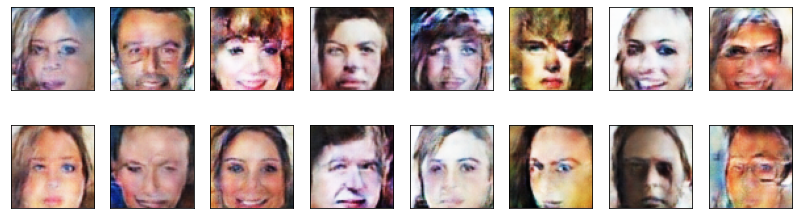

2025-09-21 02:18:16 | Epoch [25/35] | Batch 0/509 | d_loss: 1.0786 | g_loss: 1.5525
2025-09-21 02:18:20 | Epoch [25/35] | Batch 50/509 | d_loss: 1.2478 | g_loss: 2.6747
2025-09-21 02:18:24 | Epoch [25/35] | Batch 100/509 | d_loss: 0.8858 | g_loss: 1.6814
2025-09-21 02:18:28 | Epoch [25/35] | Batch 150/509 | d_loss: 1.0195 | g_loss: 0.9315
2025-09-21 02:18:31 | Epoch [25/35] | Batch 200/509 | d_loss: 0.8100 | g_loss: 1.7848
2025-09-21 02:18:35 | Epoch [25/35] | Batch 250/509 | d_loss: 0.8779 | g_loss: 1.5242
2025-09-21 02:18:39 | Epoch [25/35] | Batch 300/509 | d_loss: 0.9958 | g_loss: 1.0867
2025-09-21 02:18:43 | Epoch [25/35] | Batch 350/509 | d_loss: 0.8860 | g_loss: 1.4536
2025-09-21 02:18:47 | Epoch [25/35] | Batch 400/509 | d_loss: 0.9759 | g_loss: 2.1355
2025-09-21 02:18:51 | Epoch [25/35] | Batch 450/509 | d_loss: 1.0697 | g_loss: 2.4003
2025-09-21 02:18:55 | Epoch [25/35] | Batch 500/509 | d_loss: 1.0659 | g_loss: 0.8610


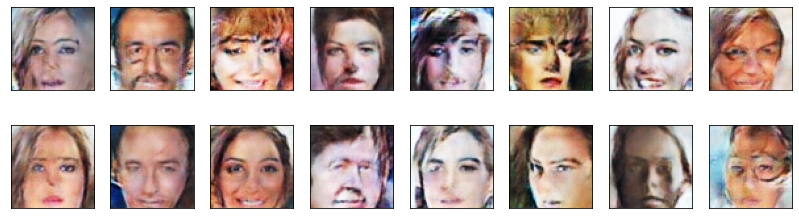

2025-09-21 02:18:58 | Epoch [26/35] | Batch 0/509 | d_loss: 0.8857 | g_loss: 1.3355
2025-09-21 02:19:02 | Epoch [26/35] | Batch 50/509 | d_loss: 0.9013 | g_loss: 1.7159
2025-09-21 02:19:06 | Epoch [26/35] | Batch 100/509 | d_loss: 1.0580 | g_loss: 1.9438
2025-09-21 02:19:09 | Epoch [26/35] | Batch 150/509 | d_loss: 1.1793 | g_loss: 1.1892
2025-09-21 02:19:13 | Epoch [26/35] | Batch 200/509 | d_loss: 0.9976 | g_loss: 1.7605
2025-09-21 02:19:17 | Epoch [26/35] | Batch 250/509 | d_loss: 0.9587 | g_loss: 1.3568
2025-09-21 02:19:21 | Epoch [26/35] | Batch 300/509 | d_loss: 0.9429 | g_loss: 1.4767
2025-09-21 02:19:25 | Epoch [26/35] | Batch 350/509 | d_loss: 0.9877 | g_loss: 1.5536
2025-09-21 02:19:29 | Epoch [26/35] | Batch 400/509 | d_loss: 0.9298 | g_loss: 2.2258
2025-09-21 02:19:33 | Epoch [26/35] | Batch 450/509 | d_loss: 0.9863 | g_loss: 1.9743
2025-09-21 02:19:37 | Epoch [26/35] | Batch 500/509 | d_loss: 1.0198 | g_loss: 2.3443


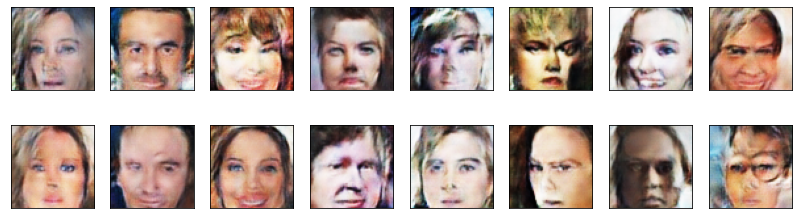

2025-09-21 02:19:41 | Epoch [27/35] | Batch 0/509 | d_loss: 0.8678 | g_loss: 1.9760
2025-09-21 02:19:45 | Epoch [27/35] | Batch 50/509 | d_loss: 0.9216 | g_loss: 1.8878
2025-09-21 02:19:48 | Epoch [27/35] | Batch 100/509 | d_loss: 1.0012 | g_loss: 2.6766
2025-09-21 02:19:52 | Epoch [27/35] | Batch 150/509 | d_loss: 0.9781 | g_loss: 1.5001
2025-09-21 02:19:56 | Epoch [27/35] | Batch 200/509 | d_loss: 1.0835 | g_loss: 2.2917
2025-09-21 02:20:00 | Epoch [27/35] | Batch 250/509 | d_loss: 1.0047 | g_loss: 1.5430
2025-09-21 02:20:04 | Epoch [27/35] | Batch 300/509 | d_loss: 1.0200 | g_loss: 2.3960
2025-09-21 02:20:08 | Epoch [27/35] | Batch 350/509 | d_loss: 0.9501 | g_loss: 1.5510
2025-09-21 02:20:12 | Epoch [27/35] | Batch 400/509 | d_loss: 1.0931 | g_loss: 1.6739
2025-09-21 02:20:16 | Epoch [27/35] | Batch 450/509 | d_loss: 1.0191 | g_loss: 1.4746
2025-09-21 02:20:20 | Epoch [27/35] | Batch 500/509 | d_loss: 0.9024 | g_loss: 1.9135


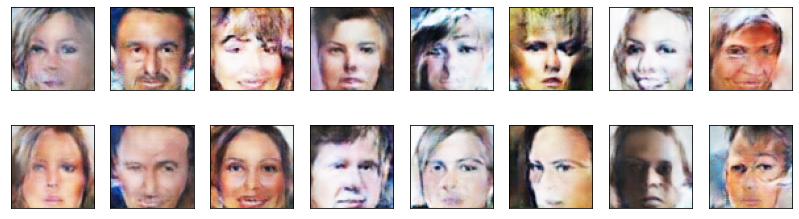

2025-09-21 02:20:23 | Epoch [28/35] | Batch 0/509 | d_loss: 0.9432 | g_loss: 2.2133
2025-09-21 02:20:27 | Epoch [28/35] | Batch 50/509 | d_loss: 0.9624 | g_loss: 2.2811
2025-09-21 02:20:31 | Epoch [28/35] | Batch 100/509 | d_loss: 0.9319 | g_loss: 2.2349
2025-09-21 02:20:34 | Epoch [28/35] | Batch 150/509 | d_loss: 1.2513 | g_loss: 1.8389
2025-09-21 02:20:38 | Epoch [28/35] | Batch 200/509 | d_loss: 0.9603 | g_loss: 1.7864
2025-09-21 02:20:42 | Epoch [28/35] | Batch 250/509 | d_loss: 1.0894 | g_loss: 0.7486
2025-09-21 02:20:46 | Epoch [28/35] | Batch 300/509 | d_loss: 0.9488 | g_loss: 1.9892
2025-09-21 02:20:50 | Epoch [28/35] | Batch 350/509 | d_loss: 0.9126 | g_loss: 1.5082
2025-09-21 02:20:54 | Epoch [28/35] | Batch 400/509 | d_loss: 0.8687 | g_loss: 2.0852
2025-09-21 02:20:58 | Epoch [28/35] | Batch 450/509 | d_loss: 0.8672 | g_loss: 1.3461
2025-09-21 02:21:02 | Epoch [28/35] | Batch 500/509 | d_loss: 0.9146 | g_loss: 1.9503


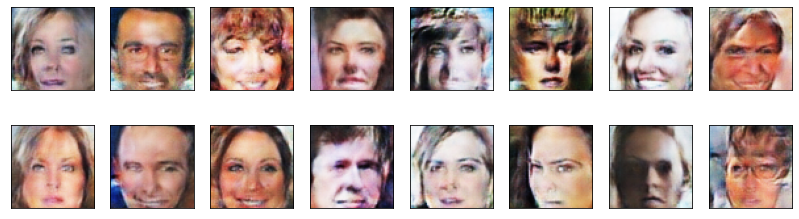

2025-09-21 02:21:05 | Epoch [29/35] | Batch 0/509 | d_loss: 0.9000 | g_loss: 1.6279
2025-09-21 02:21:09 | Epoch [29/35] | Batch 50/509 | d_loss: 0.9602 | g_loss: 1.9692
2025-09-21 02:21:13 | Epoch [29/35] | Batch 100/509 | d_loss: 1.4353 | g_loss: 3.2830
2025-09-21 02:21:17 | Epoch [29/35] | Batch 150/509 | d_loss: 1.0462 | g_loss: 1.1512
2025-09-21 02:21:21 | Epoch [29/35] | Batch 200/509 | d_loss: 0.9467 | g_loss: 1.7688
2025-09-21 02:21:25 | Epoch [29/35] | Batch 250/509 | d_loss: 1.0118 | g_loss: 1.2132
2025-09-21 02:21:29 | Epoch [29/35] | Batch 300/509 | d_loss: 0.9206 | g_loss: 1.4522
2025-09-21 02:21:33 | Epoch [29/35] | Batch 350/509 | d_loss: 0.9570 | g_loss: 1.6730
2025-09-21 02:21:37 | Epoch [29/35] | Batch 400/509 | d_loss: 1.3423 | g_loss: 1.3886
2025-09-21 02:21:40 | Epoch [29/35] | Batch 450/509 | d_loss: 1.6504 | g_loss: 3.3967
2025-09-21 02:21:44 | Epoch [29/35] | Batch 500/509 | d_loss: 0.8498 | g_loss: 1.2677


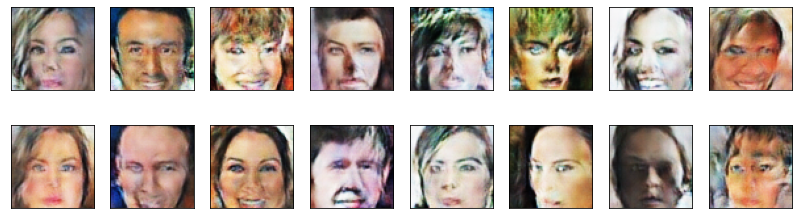

2025-09-21 02:21:48 | Epoch [30/35] | Batch 0/509 | d_loss: 0.8163 | g_loss: 1.5772
2025-09-21 02:21:52 | Epoch [30/35] | Batch 50/509 | d_loss: 1.1032 | g_loss: 2.8252
2025-09-21 02:21:56 | Epoch [30/35] | Batch 100/509 | d_loss: 0.8798 | g_loss: 1.3953
2025-09-21 02:22:00 | Epoch [30/35] | Batch 150/509 | d_loss: 0.9411 | g_loss: 1.4747
2025-09-21 02:22:04 | Epoch [30/35] | Batch 200/509 | d_loss: 0.8899 | g_loss: 1.7520
2025-09-21 02:22:07 | Epoch [30/35] | Batch 250/509 | d_loss: 0.8532 | g_loss: 2.2947
2025-09-21 02:22:11 | Epoch [30/35] | Batch 300/509 | d_loss: 1.3134 | g_loss: 1.0458
2025-09-21 02:22:15 | Epoch [30/35] | Batch 350/509 | d_loss: 0.8570 | g_loss: 1.5134
2025-09-21 02:22:19 | Epoch [30/35] | Batch 400/509 | d_loss: 1.3977 | g_loss: 3.1188
2025-09-21 02:22:23 | Epoch [30/35] | Batch 450/509 | d_loss: 0.8194 | g_loss: 1.7584
2025-09-21 02:22:27 | Epoch [30/35] | Batch 500/509 | d_loss: 0.9818 | g_loss: 0.6338


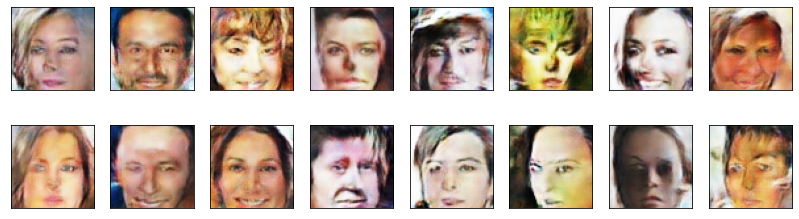

2025-09-21 02:22:31 | Epoch [31/35] | Batch 0/509 | d_loss: 0.9363 | g_loss: 1.0671
2025-09-21 02:22:35 | Epoch [31/35] | Batch 50/509 | d_loss: 0.9493 | g_loss: 1.9222
2025-09-21 02:22:39 | Epoch [31/35] | Batch 100/509 | d_loss: 0.8889 | g_loss: 1.9447
2025-09-21 02:22:43 | Epoch [31/35] | Batch 150/509 | d_loss: 0.8546 | g_loss: 1.4811
2025-09-21 02:22:47 | Epoch [31/35] | Batch 200/509 | d_loss: 0.8897 | g_loss: 1.2640
2025-09-21 02:22:51 | Epoch [31/35] | Batch 250/509 | d_loss: 1.3503 | g_loss: 3.8906
2025-09-21 02:22:54 | Epoch [31/35] | Batch 300/509 | d_loss: 1.0185 | g_loss: 0.9398
2025-09-21 02:22:58 | Epoch [31/35] | Batch 350/509 | d_loss: 0.9384 | g_loss: 1.3210
2025-09-21 02:23:02 | Epoch [31/35] | Batch 400/509 | d_loss: 1.0168 | g_loss: 1.2699
2025-09-21 02:23:06 | Epoch [31/35] | Batch 450/509 | d_loss: 1.3531 | g_loss: 2.2662
2025-09-21 02:23:10 | Epoch [31/35] | Batch 500/509 | d_loss: 0.9726 | g_loss: 2.5875


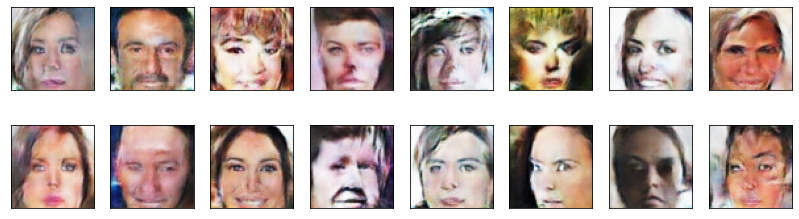

2025-09-21 02:23:14 | Epoch [32/35] | Batch 0/509 | d_loss: 0.9273 | g_loss: 1.3496
2025-09-21 02:23:18 | Epoch [32/35] | Batch 50/509 | d_loss: 0.7944 | g_loss: 1.9259
2025-09-21 02:23:22 | Epoch [32/35] | Batch 100/509 | d_loss: 1.0891 | g_loss: 1.3477
2025-09-21 02:23:25 | Epoch [32/35] | Batch 150/509 | d_loss: 0.8627 | g_loss: 1.6562
2025-09-21 02:23:29 | Epoch [32/35] | Batch 200/509 | d_loss: 0.9080 | g_loss: 1.4861
2025-09-21 02:23:33 | Epoch [32/35] | Batch 250/509 | d_loss: 1.1814 | g_loss: 3.1657
2025-09-21 02:23:37 | Epoch [32/35] | Batch 300/509 | d_loss: 1.2078 | g_loss: 2.6539
2025-09-21 02:23:41 | Epoch [32/35] | Batch 350/509 | d_loss: 0.9155 | g_loss: 1.6023
2025-09-21 02:23:45 | Epoch [32/35] | Batch 400/509 | d_loss: 1.3529 | g_loss: 3.3292
2025-09-21 02:23:49 | Epoch [32/35] | Batch 450/509 | d_loss: 0.8133 | g_loss: 1.6469
2025-09-21 02:23:53 | Epoch [32/35] | Batch 500/509 | d_loss: 0.9694 | g_loss: 1.4294


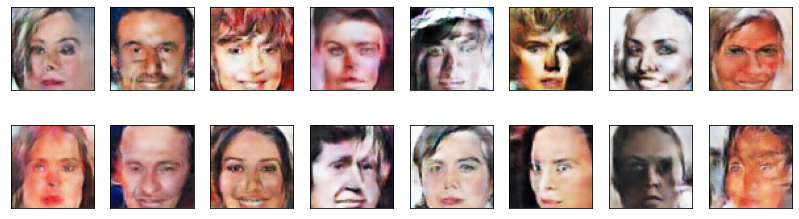

2025-09-21 02:23:56 | Epoch [33/35] | Batch 0/509 | d_loss: 0.8594 | g_loss: 2.2552
2025-09-21 02:24:00 | Epoch [33/35] | Batch 50/509 | d_loss: 0.8299 | g_loss: 1.9288
2025-09-21 02:24:04 | Epoch [33/35] | Batch 100/509 | d_loss: 1.3376 | g_loss: 3.7663
2025-09-21 02:24:07 | Epoch [33/35] | Batch 150/509 | d_loss: 0.8681 | g_loss: 1.9803
2025-09-21 02:24:11 | Epoch [33/35] | Batch 200/509 | d_loss: 0.9066 | g_loss: 2.2343
2025-09-21 02:24:15 | Epoch [33/35] | Batch 250/509 | d_loss: 0.9350 | g_loss: 2.1435
2025-09-21 02:24:19 | Epoch [33/35] | Batch 300/509 | d_loss: 0.8363 | g_loss: 1.4814
2025-09-21 02:24:23 | Epoch [33/35] | Batch 350/509 | d_loss: 0.8088 | g_loss: 1.9580
2025-09-21 02:24:27 | Epoch [33/35] | Batch 400/509 | d_loss: 0.8890 | g_loss: 1.8789
2025-09-21 02:24:31 | Epoch [33/35] | Batch 450/509 | d_loss: 0.9019 | g_loss: 1.8921
2025-09-21 02:24:35 | Epoch [33/35] | Batch 500/509 | d_loss: 0.9686 | g_loss: 2.5344


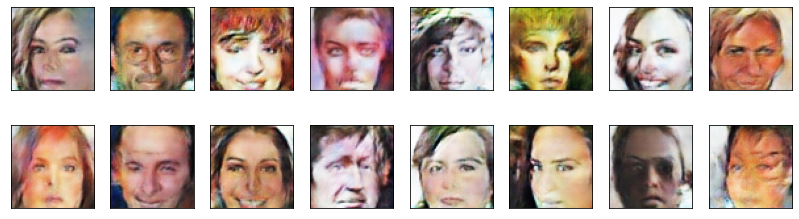

2025-09-21 02:24:39 | Epoch [34/35] | Batch 0/509 | d_loss: 0.9369 | g_loss: 1.7099
2025-09-21 02:24:43 | Epoch [34/35] | Batch 50/509 | d_loss: 0.8854 | g_loss: 2.0957
2025-09-21 02:24:46 | Epoch [34/35] | Batch 100/509 | d_loss: 1.1243 | g_loss: 0.8774
2025-09-21 02:24:50 | Epoch [34/35] | Batch 150/509 | d_loss: 0.9260 | g_loss: 2.0917
2025-09-21 02:24:54 | Epoch [34/35] | Batch 200/509 | d_loss: 1.1283 | g_loss: 1.1451
2025-09-21 02:24:58 | Epoch [34/35] | Batch 250/509 | d_loss: 0.9214 | g_loss: 1.0422
2025-09-21 02:25:02 | Epoch [34/35] | Batch 300/509 | d_loss: 0.8728 | g_loss: 1.4911
2025-09-21 02:25:06 | Epoch [34/35] | Batch 350/509 | d_loss: 1.0290 | g_loss: 2.0281
2025-09-21 02:25:10 | Epoch [34/35] | Batch 400/509 | d_loss: 1.1198 | g_loss: 1.5410
2025-09-21 02:25:14 | Epoch [34/35] | Batch 450/509 | d_loss: 0.8713 | g_loss: 1.4433
2025-09-21 02:25:18 | Epoch [34/35] | Batch 500/509 | d_loss: 0.9331 | g_loss: 2.0882


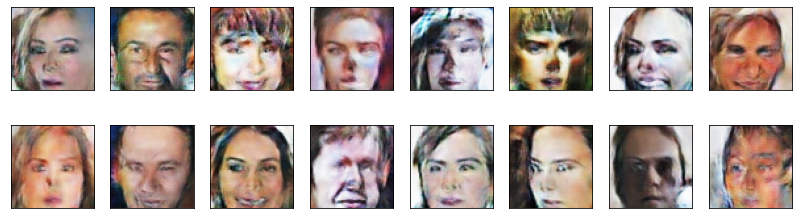

2025-09-21 02:25:21 | Epoch [35/35] | Batch 0/509 | d_loss: 0.8268 | g_loss: 2.2278
2025-09-21 02:25:25 | Epoch [35/35] | Batch 50/509 | d_loss: 0.9371 | g_loss: 2.0692
2025-09-21 02:25:29 | Epoch [35/35] | Batch 100/509 | d_loss: 1.2430 | g_loss: 2.5891
2025-09-21 02:25:33 | Epoch [35/35] | Batch 150/509 | d_loss: 0.8953 | g_loss: 1.0064
2025-09-21 02:25:36 | Epoch [35/35] | Batch 200/509 | d_loss: 0.9366 | g_loss: 1.6678
2025-09-21 02:25:40 | Epoch [35/35] | Batch 250/509 | d_loss: 1.0623 | g_loss: 2.6087
2025-09-21 02:25:44 | Epoch [35/35] | Batch 300/509 | d_loss: 0.8849 | g_loss: 2.0506
2025-09-21 02:25:48 | Epoch [35/35] | Batch 350/509 | d_loss: 0.7255 | g_loss: 1.8383
2025-09-21 02:25:52 | Epoch [35/35] | Batch 400/509 | d_loss: 0.9540 | g_loss: 1.2347
2025-09-21 02:25:56 | Epoch [35/35] | Batch 450/509 | d_loss: 0.7373 | g_loss: 1.4313
2025-09-21 02:26:00 | Epoch [35/35] | Batch 500/509 | d_loss: 1.2608 | g_loss: 3.0342


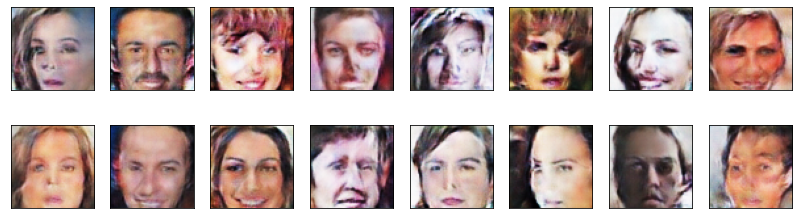

In [21]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################
        
        # 1. train discriminator
        if batch_i % 2 == 0: # to train the generator more then the discriminator
            d_loss = discriminator_step(batch_size, latent_dim, real_images)
            
        # 2. train generator
        g_loss = generator_step(batch_size, latent_dim)
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

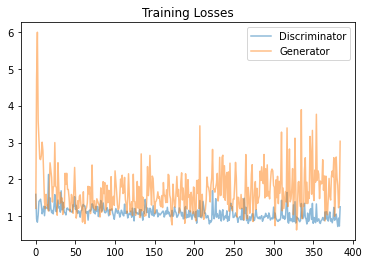

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white




* Model size; larger models have the opportunity to learn more features in a data feature space



* Optimization strategy; optimizers and number of epochs affect your final result


* Loss functions

**Answer:** (Write your answer in this cell)
Dataset Quality

The dataset appears to be well-prepared and suitable for training.

Images are generally good in quality.

Generator Performance

The generator struggles to extract features effectively.

Facial components such as the nose and eyes are not generated accurately.

Overall generator effectiveness is low, and the associated loss is relatively high.

Discriminator Performance

The discriminator is functioning well and shows low loss.

It is able to distinguish between real and generated images effectively.

Recommendations

Additional parameters should be considered to reduce generator loss.

Despite improvements in the discriminator, the generator's performance remains suboptimal.

Adjusting the learning rate and increasing the number of epochs has improved discriminator performance, but it has also led to a significant increase in generator loss.

Loss Functionn:
The loss function tells the generator how far off its output is from the desired result.

A well-designed loss function helps the model learn subtle facial features like eyes, nose, and expressions more accurately
generator tries to fool the discriminator. If the loss function is too lenient or too harsh, it can destabilize training.


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.